In [1]:
library(IRdisplay)
display_html("<style>.container { width:100% !important; }</style>")

.libPaths()

[1] "/hps/software/users/marioni/Leah/miniconda3/envs/basic_renv/lib/R/library"

# Cardiac Gastruloid Data (past d5)
https://www.cell.com/cell-stem-cell/fulltext/S1934-5909(20)30507-5?_returnURL=https[…]vier.com%2Fretrieve%2Fpii%2FS1934590920305075%3Fshowall%3Dtrue

In [2]:
suppressPackageStartupMessages(library(data.table))
suppressPackageStartupMessages(library(purrr))
suppressPackageStartupMessages(library(Seurat))
suppressPackageStartupMessages(library(assertthat))
suppressPackageStartupMessages(library(optparse))
suppressPackageStartupMessages(library(scran))
suppressPackageStartupMessages(library(scds))
suppressPackageStartupMessages(library(dplyr))
suppressPackageStartupMessages(library(gprofiler2))
suppressPackageStartupMessages(library(ggplot2))
suppressPackageStartupMessages(library(gridExtra))
suppressPackageStartupMessages(library(viridis))
source("/nfs/research/marioni/Leah/gastrulation_epigenetics/gastruloid_characterisation/gastruloids_scRNAseq/plotting_settings.R")

# Load Data

In [3]:
# Load Data
rawdata <-Read10X(data.dir = '/nfs/research/marioni/Leah/gastrulation_epigenetics/gastruloid_characterisation/other_data/rossi/outs/', gene.column = 1)
metadata <-read.table(file = "/nfs/research/marioni/Leah/gastrulation_epigenetics/gastruloid_characterisation/other_data/rossi/outs/GSE158999_metadata.tsv.gz", header = T, sep = "\t", row.names = 1)
metadata$cell <- rownames(metadata)
metadata #celltype is cluster number

,nCount_RNA,nFeature_RNA,Dataset,batch,percent.mito,celltype,Replicate,stage,louvain_clusters,UMAP_1,⋯,harmony_24,harmony_25,harmony_26,harmony_27,harmony_28,harmony_29,harmony_30,doublet_score,pijuansala_transfer,cell
,<int>,<int>,<chr>,<int>,<dbl>,<chr>,<int>,<chr>,<int>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
GAS_Day4_batch4_AAACCCATCGACTCCT,53183,6676,GAS_Day4_batch4,4,4.129139,Definitive endoderm,0,Day4,34,56.404637,⋯,-0.06551584,-0.9370832,-0.31541432,3.75234667,-1.48334482,1.07545569,-1.3848734,0.3739130,Def. endoderm,GAS_Day4_batch4_AAACCCATCGACTCCT
GAS_Day4_batch4_AAACGAAGTCATAACC,41938,5225,GAS_Day4_batch4,4,2.348705,Primitive streak,0,Day4,33,9.503052,⋯,-1.10108191,-0.8714183,-0.64652392,0.70519319,0.03235515,-0.06505822,-1.5117548,0.2086957,Epiblast,GAS_Day4_batch4_AAACGAAGTCATAACC
GAS_Day4_batch4_AAACGCTCAAGCGAGT,43631,5869,GAS_Day4_batch4,4,7.863675,Primitive streak,0,Day4,30,37.911728,⋯,-0.01572755,0.5715223,1.38396570,-1.38166748,2.39080416,-0.77203360,-0.8776625,0.2260870,Primitive Streak,GAS_Day4_batch4_AAACGCTCAAGCGAGT
GAS_Day4_batch4_AAACGCTCACCCTAAA,69730,7090,GAS_Day4_batch4,4,6.030403,Caudal mesoderm,0,Day4,9,2.252261,⋯,0.29184623,-0.2884927,0.14044470,0.83211892,0.42497393,0.95891539,-0.5660748,0.2173913,Caudal epiblast,GAS_Day4_batch4_AAACGCTCACCCTAAA
GAS_Day4_batch4_AAAGAACAGCCTTGAT,64691,7039,GAS_Day4_batch4,4,5.057891,Early mesoderm,0,Day4,27,-23.518642,⋯,-1.06017487,1.6409149,0.69875903,3.79780608,-1.34279328,-2.64968270,4.4971043,0.2260870,Nascent mesoderm,GAS_Day4_batch4_AAAGAACAGCCTTGAT
GAS_Day4_batch4_AAAGAACAGTTTCGAC,39653,5568,GAS_Day4_batch4,4,6.662800,Early mesoderm,0,Day4,16,-42.542312,⋯,0.31099583,0.2311200,-1.26290422,-0.09724780,0.09429867,-1.01476396,1.1562125,0.1913043,Nascent mesoderm,GAS_Day4_batch4_AAAGAACAGTTTCGAC
GAS_Day4_batch4_AAAGAACCAATTCGTG,49804,6208,GAS_Day4_batch4,4,6.660108,Nascent mesoderm,0,Day4,43,52.927852,⋯,-0.83693150,1.2740135,-1.27887192,1.39498005,-0.37454261,-2.20837379,2.2638349,0.2521739,Nascent mesoderm,GAS_Day4_batch4_AAAGAACCAATTCGTG
GAS_Day4_batch4_AAAGAACGTGAGCTCC,41764,5684,GAS_Day4_batch4,4,7.379561,Caudal mesoderm,0,Day4,1,30.837438,⋯,0.97240132,-0.4546514,-0.01551562,0.20678964,1.19351195,-0.61844989,1.7192034,0.3043478,Primitive Streak,GAS_Day4_batch4_AAAGAACGTGAGCTCC
GAS_Day4_batch4_AAAGAACGTGCACATT,18571,3450,GAS_Day4_batch4,4,9.180981,Primitive streak,0,Day4,33,30.184737,⋯,-0.16067632,0.1104374,-2.61320429,-0.65245647,-0.11298219,-0.51636778,-2.0623473,0.1565217,Primitive Streak,GAS_Day4_batch4_AAAGAACGTGCACATT


In [4]:
as.data.table(metadata)[,.N,by=c("Dataset", "batch", "Replicate", "stage")]

Dataset,batch,Replicate,stage,N
<chr>,<int>,<int>,<chr>,<int>
GAS_Day4_batch4,4,0,Day4,2824
GAS_Day4_batch5,5,1,Day4,4074
GAS_Day5_batch3,3,1,Day5,3467
GAS_Day5_batch4,4,0,Day5,4316
GAS_Day6_batch2,2,0,Day6,3815
GAS_Day6_batch3,3,1,Day6,4498
GAS_Day7_batch1,1,1,Day7,3186
GAS_Day7_batch2,2,0,Day7,4316


# Create Seurat

In [5]:
genemeta <- fread('/nfs/research/marioni/Leah/gastrulation_epigenetics/gastruloid_characterisation/data_dir/processed_files_Leah/scRNAseq/gene_metadata_atlas_gastr_hvgs.txt.gz')
rawdata <- rawdata[(rownames(rawdata) %in% genemeta$symbol),]
genemeta <- genemeta[match(rownames(rawdata), genemeta$symbol),]
rownames(genemeta) <- genemeta$ens_id
rownames(rawdata) <- genemeta$ens_id
srat_rossi <- CreateSeuratObject(counts = rawdata, project = "Cardiac Gastruloids", meta.data = metadata)
srat_rossi[["RNA"]] <- AddMetaData(
    object = srat_rossi[["RNA"]],
    metadata = genemeta
)


# QC

In [6]:
mito.genes <- srat_rossi@assays$RNA@meta.features$ens_id[grepl(pattern = "^mt-", x = srat_rossi@assays$RNA@meta.features$symbol)]
srat_rossi[["percent.mt"]] <- PercentageFeatureSet(srat_rossi, features = mito.genes)
ribo.genes <- srat_rossi@assays$RNA@meta.features$ens_id[grepl(pattern = "^Rpl", x = srat_rossi@assays$RNA@meta.features$symbol) | grepl(pattern = "^Rps", x = srat_rossi@assays$RNA@meta.features$symbol)]
srat_rossi[["percent.ribo"]] <- PercentageFeatureSet(srat_rossi, features = ribo.genes)

md <- as.data.table(srat_rossi@meta.data)

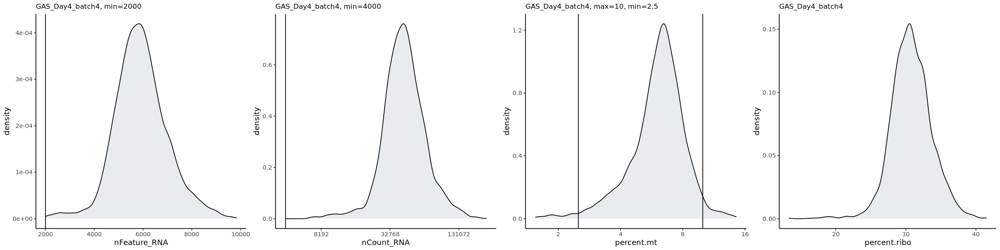

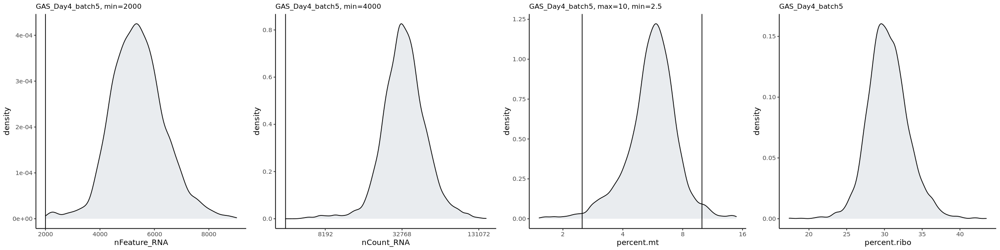

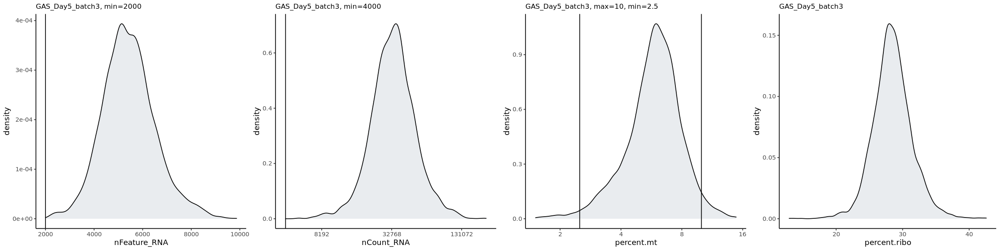

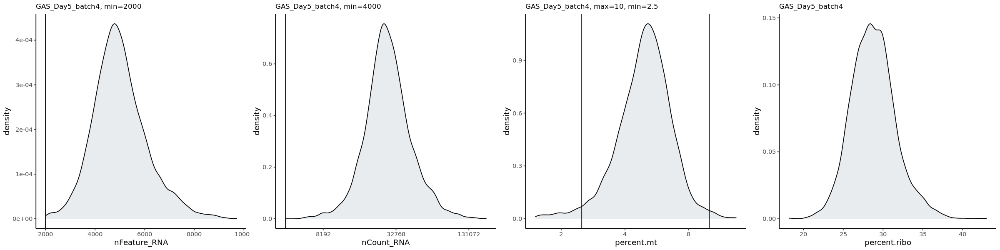

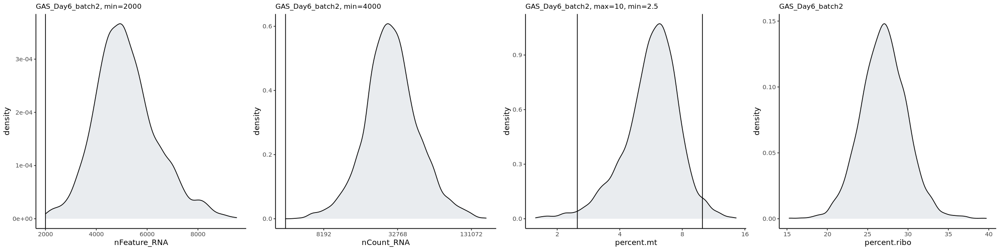

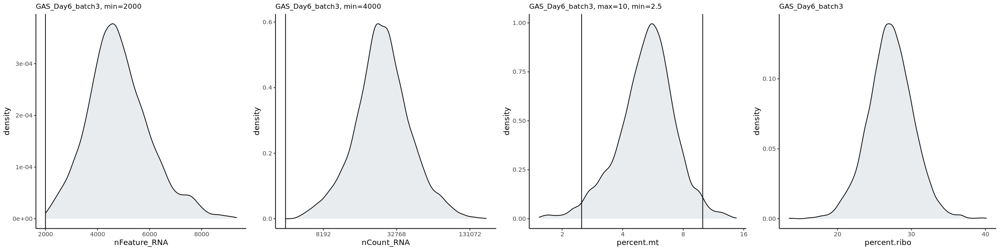

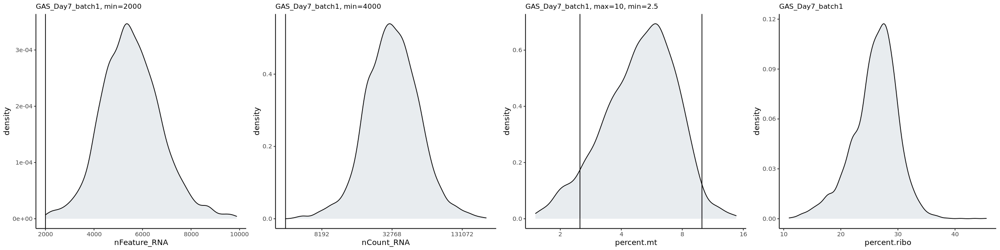

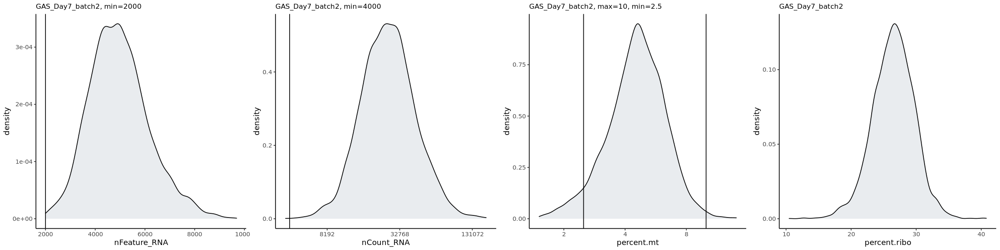

In [7]:
options(repr.plot.width=20, repr.plot.height=5)
options(warn=-1)

io <- list()
io$min_nFeature_RNA <- 2000
io$min_nCount_RNA <- 4000
io$max_percent.mt <- 10
io$min_percent.mt <- 2.5

for (b in unique(md$Dataset)) {
    
    bi <- strsplit(b,"_")[[1]] %>% .[length(.)]

    toplot <- md[Dataset==b]

    p1 <- (ggplot(toplot, aes(x=nFeature_RNA)) +
        geom_density(fill="#e9ecef", position = 'identity') +
        #scale_fill_manual(values=c("#69b3a2")) +
        labs(fill="") +
        geom_vline(xintercept=io$min_nFeature_RNA) +
        ggtitle(paste0(b, ", min=", io$min_nFeature_RNA)) +
        theme_classic() +
        theme(plot.title = element_text(size = 10)))

    p2 <- (ggplot(toplot, aes(x=nCount_RNA)) +
        geom_density(fill="#e9ecef", position = 'identity') +
        labs(fill="") +
        scale_x_continuous(trans='log2') +
        geom_vline(xintercept=io$min_nCount_RNA) +
        ggtitle(paste0(b, ", min=", io$min_nCount_RNA)) +
        theme_classic() +
        theme(plot.title = element_text(size = 10)))

    p3 <- (ggplot(toplot, aes(x=percent.mt)) +
        geom_density(fill="#e9ecef", position = 'identity') +
        labs(fill="") +
        scale_x_continuous(trans='log2') +
        geom_vline(xintercept=io$max_percent.mt) +
        geom_vline(xintercept=io$min_percent.mt) +
        ggtitle(paste0(b, ", max=", io$max_percent.mt, ", min=", io$min_percent.mt)) +
        theme_classic() +
        theme(plot.title = element_text(size = 10)))

    p4 <- (ggplot(toplot, aes(x=percent.ribo)) +
        geom_density(fill="#e9ecef", position = 'identity') +
        labs(fill="") +
        ggtitle(b) +
        theme_classic() +
        theme(plot.title = element_text(size = 10)))

    grid.arrange(p1, p2, p3, p4, ncol=4)

}
options(warn=0)

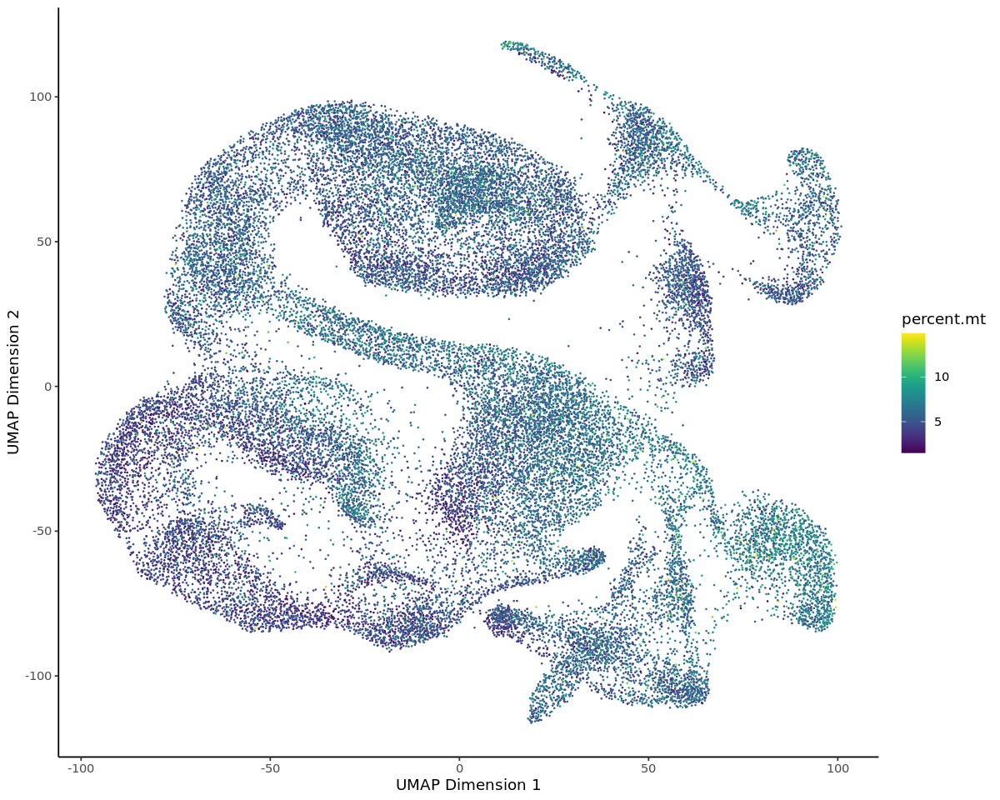

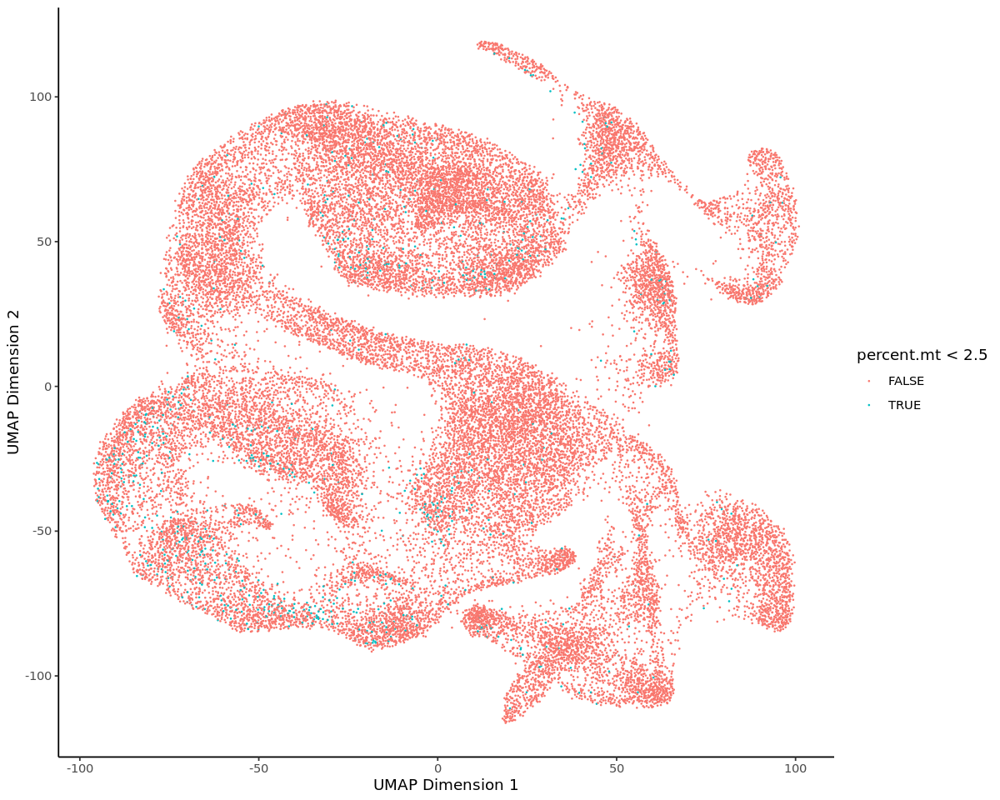

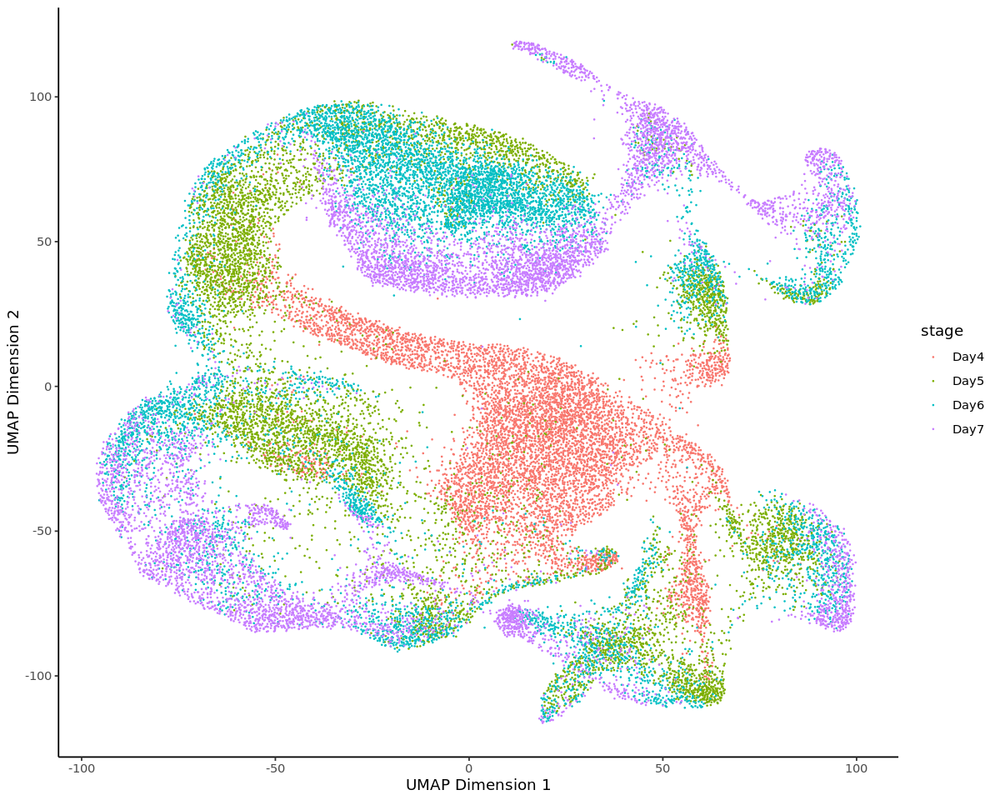

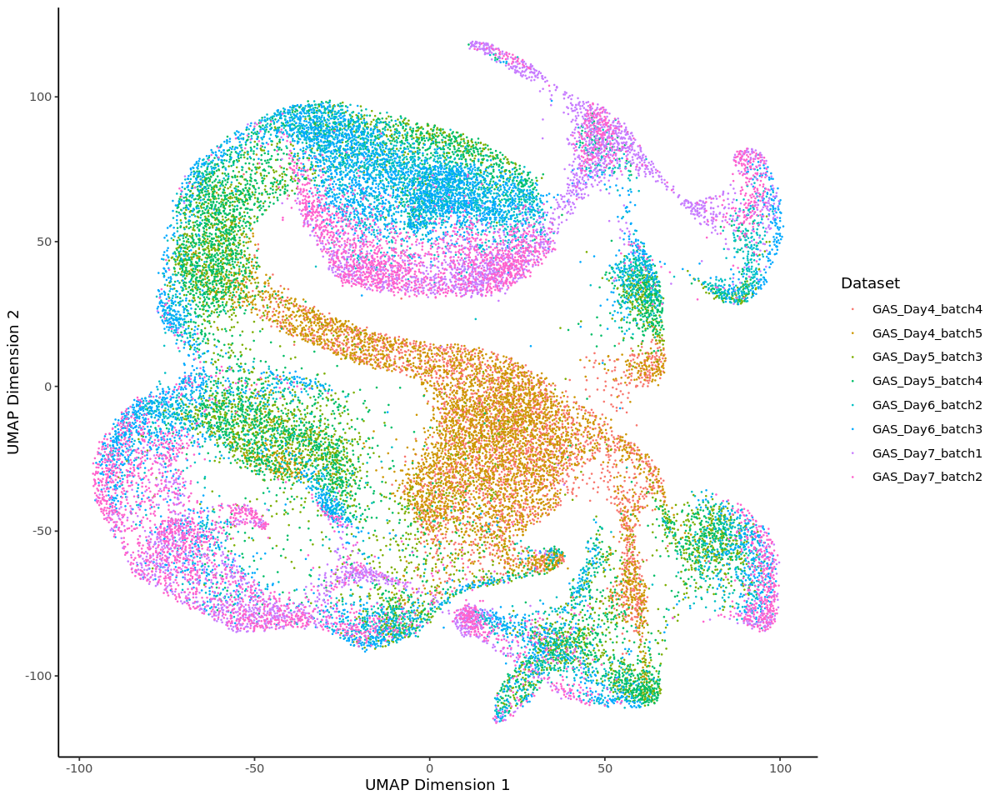

In [8]:
options(repr.plot.width=10, repr.plot.height=8)
p <- ggplot(data=md, mapping = aes(x=UMAP_1, y=UMAP_2, colour=percent.mt)) +
  geom_point(size=0.1, alpha=1) +
  # ggrastr::geom_point_rast(size=opts$dot_size, alpha=opts$dot_alpha) +
  labs(x="UMAP Dimension 1", y="UMAP Dimension 2") +
  scale_colour_viridis() +
  theme_classic()
print(p)
p <- ggplot(data=md, mapping = aes(x=UMAP_1, y=UMAP_2, colour=percent.mt<2.5)) +
  geom_point(size=0.1, alpha=1) +
  # ggrastr::geom_point_rast(size=opts$dot_size, alpha=opts$dot_alpha) +
  labs(x="UMAP Dimension 1", y="UMAP Dimension 2") +
  theme_classic()
print(p)
p <- ggplot(data=md, mapping = aes(x=UMAP_1, y=UMAP_2, colour=stage)) +
  geom_point(size=0.1, alpha=1) +
  # ggrastr::geom_point_rast(size=opts$dot_size, alpha=opts$dot_alpha) +
  labs(x="UMAP Dimension 1", y="UMAP Dimension 2") +
  theme_classic()
print(p)
p <- ggplot(data=md, mapping = aes(x=UMAP_1, y=UMAP_2, colour=Dataset)) +
  geom_point(size=0.1, alpha=1) +
  # ggrastr::geom_point_rast(size=opts$dot_size, alpha=opts$dot_alpha) +
  labs(x="UMAP Dimension 1", y="UMAP Dimension 2") +
  theme_classic()
print(p)

In [9]:
io$s.genes.ensid <- '/nfs/research/marioni/Leah/data/cell_cycle_genes/s_genes_ENS.txt'
io$g2m.genes.ensid <- '/nfs/research/marioni/Leah/data/cell_cycle_genes/g2m_genes_ENS.txt'
io$k <- 30

In [10]:
srat_rossi_list <- SplitObject(srat_rossi, split.by = "Dataset")
md_list <- list()
for (b in unique(md$Dataset)) {
    sce_tmp <- as.SingleCellExperiment(srat_rossi_list[[b]])
    sce_tmp <- cxds_bcds_hybrid(sce_tmp, estNdbl=TRUE)
    md_list[[b]] <- merge(as.data.table(md[Dataset==b]), as.data.table(colData(sce_tmp))[,c("cell", "cxds_score", "cxds_call", "bcds_score", "bcds_call", "hybrid_score", "hybrid_call")], all.x=TRUE, by="cell")
    md_list[[b]][,pass_QC := FALSE]
    md_list[[b]][cell %in% Cells(srat_rossi_list[[b]]), pass_QC := TRUE]
    rownames(md_list[[b]]) <- md_list[[b]]$cell
    srat_rossi_list[[b]]@meta.data <- md_list[[b]][pass_QC==TRUE]
    rownames(srat_rossi_list[[b]]@meta.data) <- srat_rossi_list[[b]]@meta.data$cell

    srat_rossi_list[[b]] <- NormalizeData(srat_rossi_list[[b]])
    srat_rossi_list[[b]] <- FindVariableFeatures(srat_rossi_list[[b]])
    srat_rossi_list[[b]]@assays$RNA@scale.data <- as.matrix(srat_rossi_list[[b]]@assays$RNA@data)
    srat_rossi_list[[b]] <- RunPCA(srat_rossi_list[[b]], verbose=FALSE)
    srat_rossi_list[[b]] <- FindNeighbors(srat_rossi_list[[b]], k.param=io$k, reduction = "pca")
    rownames(srat_rossi_list[[b]]@meta.data) <- srat_rossi_list[[b]]@meta.data$cell
    srat_rossi_list[[b]] <- CellCycleScoring(srat_rossi_list[[b]],
                                             s.features = fread(io$s.genes.ensid, header = FALSE)$V1,
                                             g2m.features = fread(io$g2m.genes.ensid, header = FALSE)$V1,
                                             set.ident = FALSE
                                            )

    tmp <- data.table(hybrid_map = rowSums(srat_rossi_list[[b]]@graphs$RNA_nn[,md_list[[b]][hybrid_call==TRUE]$cell])/io$k,
                      cell = rownames(srat_rossi_list[[b]]@graphs$RNA_snn))
    md_list[[b]] <- merge(md_list[[b]], tmp, by = "cell", all.x=TRUE)
    md_list[[b]][hybrid_call==TRUE, hybrid_map := NA]
    md_list[[b]][,hybrid_call2 := TRUE]
    md_list[[b]][hybrid_map<=((sum(md_list[[b]][pass_QC==TRUE]$hybrid_call==TRUE))/(dim(md_list[[b]][pass_QC==TRUE])[1])), hybrid_call2 := FALSE]
    md_list[[b]][pass_QC==FALSE, hybrid_call2 := NA]
    rownames(md_list[[b]]) <- md_list[[b]]$cell

    md_list[[b]] <- merge(md_list[[b]], srat_rossi_list[[b]]@meta.data[,c("cell", "S.Score", "G2M.Score", "Phase")], by="cell", all.x=TRUE)
    rownames(md_list[[b]]) <- md_list[[b]]$cell
}
md <- rbindlist(md_list)
rownames(md) <- md$cell
srat_rossi@meta.data <- md

Setting levels: control = 0, case = 1

Setting direction: controls < cases



[14:18:02] WARNING: amalgamation/../src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


Setting levels: control = 0, case = 1

Setting direction: controls < cases

Setting levels: control = 0, case = 1

Setting direction: controls < cases

Computing nearest neighbor graph

Computing SNN

Setting levels: control = 0, case = 1

Setting direction: controls < cases



[14:18:50] WARNING: amalgamation/../src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


Setting levels: control = 0, case = 1

Setting direction: controls < cases

Setting levels: control = 0, case = 1

Setting direction: controls < cases

Computing nearest neighbor graph

Computing SNN

Setting levels: control = 0, case = 1

Setting direction: controls < cases



[14:19:41] WARNING: amalgamation/../src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


Setting levels: control = 0, case = 1

Setting direction: controls < cases

Setting levels: control = 0, case = 1

Setting direction: controls < cases

Computing nearest neighbor graph

Computing SNN

Setting levels: control = 0, case = 1

Setting direction: controls < cases



[14:20:35] WARNING: amalgamation/../src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


Setting levels: control = 0, case = 1

Setting direction: controls < cases

Setting levels: control = 0, case = 1

Setting direction: controls < cases

Computing nearest neighbor graph

Computing SNN

Setting levels: control = 0, case = 1

Setting direction: controls < cases



[14:21:22] WARNING: amalgamation/../src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


Setting levels: control = 0, case = 1

Setting direction: controls < cases

Setting levels: control = 0, case = 1

Setting direction: controls < cases

Computing nearest neighbor graph

Computing SNN

Setting levels: control = 0, case = 1

Setting direction: controls < cases



[14:22:08] WARNING: amalgamation/../src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


Setting levels: control = 0, case = 1

Setting direction: controls < cases

Setting levels: control = 0, case = 1

Setting direction: controls < cases

Computing nearest neighbor graph

Computing SNN

Setting levels: control = 0, case = 1

Setting direction: controls < cases



[14:22:52] WARNING: amalgamation/../src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


Setting levels: control = 0, case = 1

Setting direction: controls < cases

Setting levels: control = 0, case = 1

Setting direction: controls < cases

Computing nearest neighbor graph

Computing SNN

Setting levels: control = 0, case = 1

Setting direction: controls < cases



[14:23:43] WARNING: amalgamation/../src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


Setting levels: control = 0, case = 1

Setting direction: controls < cases

Setting levels: control = 0, case = 1

Setting direction: controls < cases

Computing nearest neighbor graph

Computing SNN



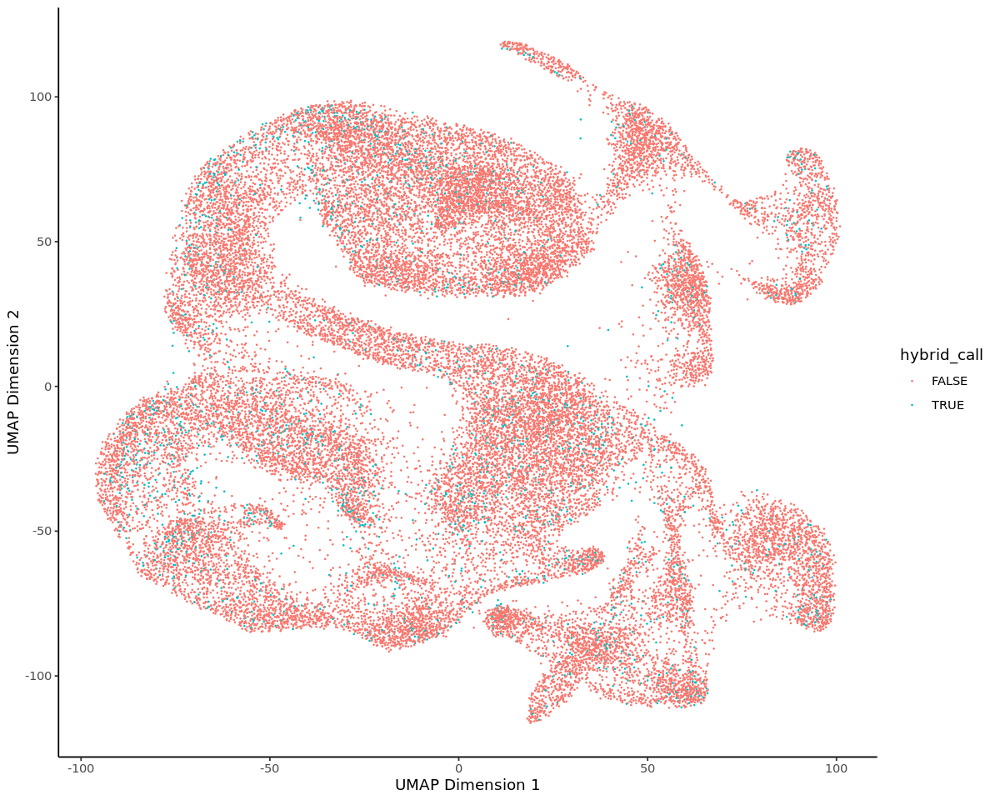

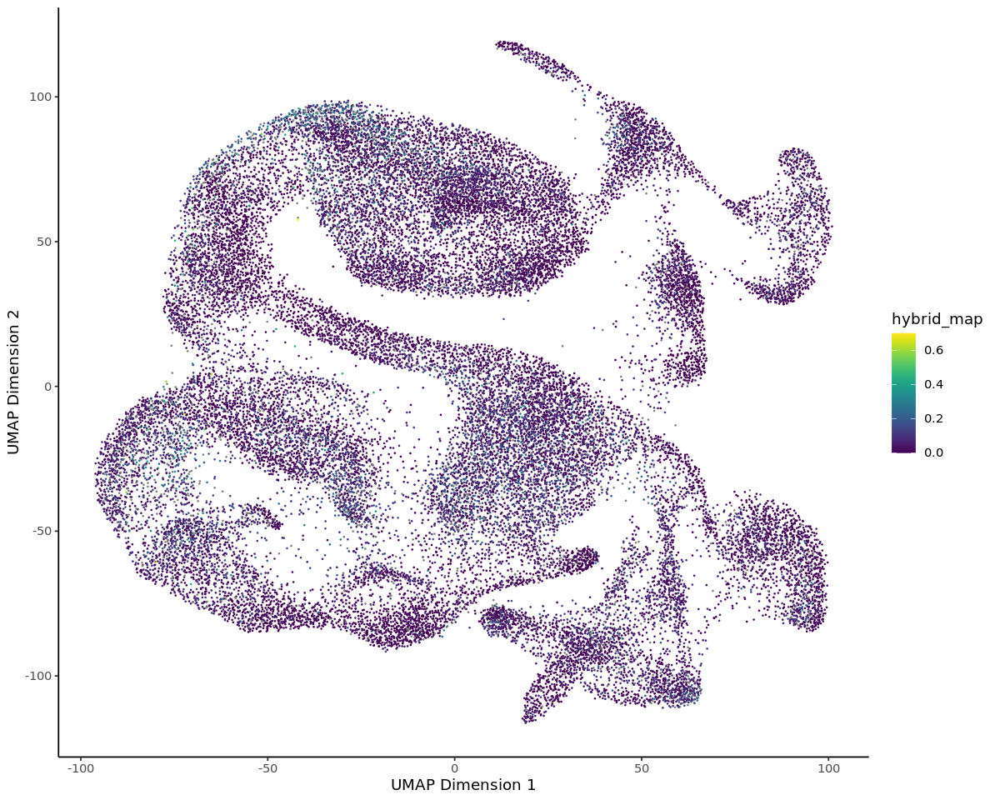

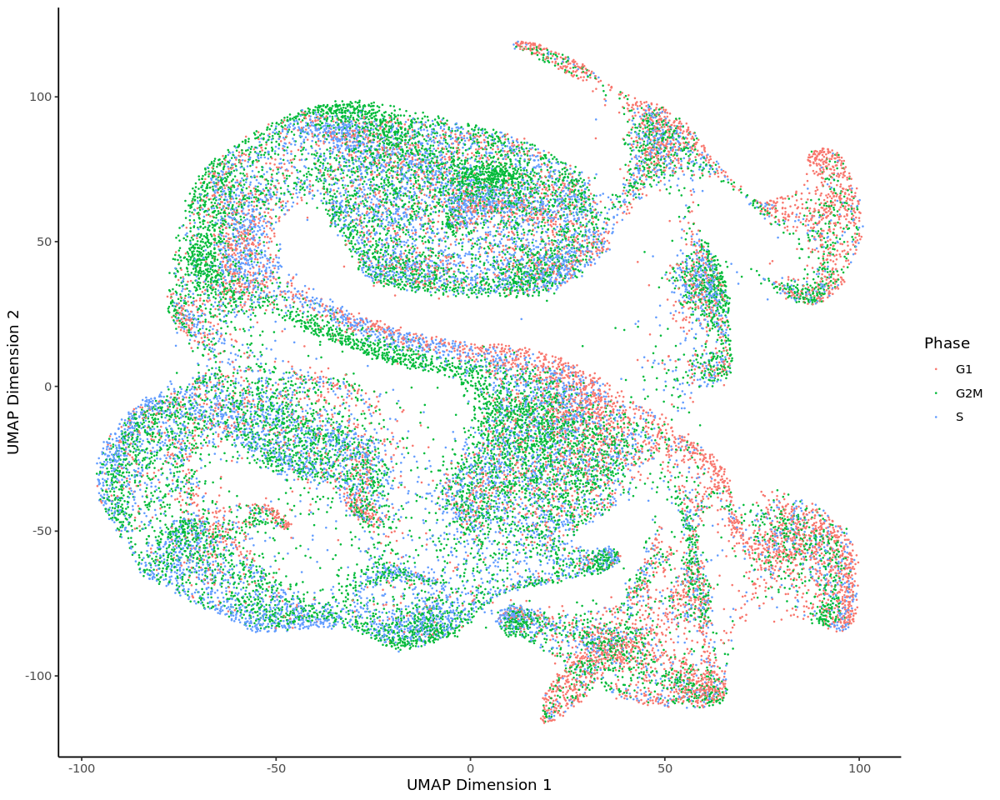

In [11]:
options(repr.plot.width=10, repr.plot.height=8)
p <- ggplot(data=md, mapping = aes(x=UMAP_1, y=UMAP_2, colour=hybrid_call)) +
  geom_point(size=0.1, alpha=1) +
  # ggrastr::geom_point_rast(size=opts$dot_size, alpha=opts$dot_alpha) +
  labs(x="UMAP Dimension 1", y="UMAP Dimension 2") +
  theme_classic()
print(p)
p <- ggplot(data=md, mapping = aes(x=UMAP_1, y=UMAP_2, colour=hybrid_map)) +
  geom_point(size=0.1, alpha=1) +
  # ggrastr::geom_point_rast(size=opts$dot_size, alpha=opts$dot_alpha) +
  labs(x="UMAP Dimension 1", y="UMAP Dimension 2") +
  scale_colour_viridis() +
  theme_classic()
print(p)
p <- ggplot(data=md, mapping = aes(x=UMAP_1, y=UMAP_2, colour=Phase)) +
  geom_point(size=0.1, alpha=1) +
  # ggrastr::geom_point_rast(size=opts$dot_size, alpha=opts$dot_alpha) +
  labs(x="UMAP Dimension 1", y="UMAP Dimension 2") +
  theme_classic()
print(p)

# Map within itself

In [14]:
suppressPackageStartupMessages(library(SingleCellExperiment))
suppressPackageStartupMessages(library(data.table))
suppressPackageStartupMessages(library(purrr))
suppressPackageStartupMessages(library(ggplot2))
suppressPackageStartupMessages(library(scran))
suppressPackageStartupMessages(library(batchelor))
suppressPackageStartupMessages(library(tools))
suppressPackageStartupMessages(library(stringr))
suppressPackageStartupMessages(library(umap))

In [64]:
source('/nfs/research/marioni/Leah/gastrulation_epigenetics/gastruloid_characterisation/gastruloids_scRNAseq/pipeline/mapping/mapping_functions.R')

mapNoAtlas <- function(sce, meta, k = 30, npcs = 50, return.list = FALSE){
  
  message("Normalizing joint dataset...")
  sce_all <- SingleCellExperiment::SingleCellExperiment(list(counts=counts(sce)))
  big_sce <- multiBatchNorm(sce_all, batch=c(meta$batch))
  message("Done\n")
  
  message("Computing highly variable genes...")
  hvgs    <- getHVGs(big_sce, block=c(meta$batch))
  message("Done\n")
  
  message("Performing PCA...")
  full_pca <- multiBatchPCA(big_sce,
                           batch=c(meta$batch),
                           subset.row = hvgs,
                           d = npcs,
                           preserve.single = TRUE,
                           get.variance=TRUE,
                           assay.type = "logcounts")
  big_pca <- full_pca[[1]]
  rownames(big_pca) <- colnames(big_sce)
  message("Done\n")
  
  message("Batch effect correction...")  
  order_df        <- meta[!duplicated(meta$batch), c("timepoint", "batch")]
  order_df$ncells <- sapply(order_df$batch, function(x) sum(meta$batch == x))
  order_df$timepoint  <- factor(order_df$timepoint, 
                                levels = rev(c("d7", "d6", "d5", 'd4.5_d5', "d4.5", 'd4_d4.5', "d4", "d3.5_d4", "d3.5", "d3_d3.5", "d3"))
                               )
  order_df       <- order_df[order(order_df$timepoint, order_df$ncells, decreasing = TRUE),]
  order_df$timepoint <- as.character(order_df$timepoint)
  message(order_df)
  
  set.seed(42)
  corrected <- doBatchCorrect(counts          = logcounts(big_sce[hvgs,]), 
                              timepoints      = meta$timepoint, 
                              samples         = meta$batch, 
                              timepoint_order = order_df$timepoint, 
                              sample_order    = order_df$batch, 
                              pc_override     = big_pca,
                              npc             = npcs)
  message("Done\n")
  out <- list()
  out$corrected <- corrected
  out$pca <- full_pca
  message("Done\n")
  
  return(out)
  
}

io$min.counts.per.gene <- 50
io$npcs <- 50

In [16]:
sce_query <- Seurat::as.SingleCellExperiment( srat_rossi )
rownames(colData(sce_query)) <- colData(sce_query)$cell
meta_query <- copy(md)
meta_query <- setnames(meta_query, c("Dataset", "stage"), c("batch", "timepoint"))
meta_query[timepoint == 'Day7', timepoint := 'd7']
meta_query[timepoint == 'Day6', timepoint := 'd6']
meta_query[timepoint == 'Day5', timepoint := 'd5']
meta_query[timepoint == 'Day4', timepoint := 'd4']

In [17]:
message("Filtering genes...")
dim(sce_query)
sce_query  <- sce_query[(rownames(sce_query) %in% as.data.table(srat_rossi@assays$RNA@meta.features)[!(cc_gene)]$ens_id),]
dim(sce_query)

Filtering genes...



[1] 22578 30496

[1] 21407 30496

In [16]:
message("MNN mapping...")
correct_sce <- mapNoAtlas(sce_query, meta_query, k = io$k, npcs = io$npcs, return.list = FALSE)
message("Done\n")

MNN mapping...

Normalizing joint dataset...

Done


Computing highly variable genes...

Done


Performing PCA...

Done


Batch effect correction...

c("Day7", "Day7", "Day6", "Day6", "Day5", "Day5", "Day4", "Day4")c("GAS_Day7_batch2", "GAS_Day7_batch1", "GAS_Day6_batch3", "GAS_Day6_batch2", "GAS_Day5_batch4", "GAS_Day5_batch3", "GAS_Day4_batch5", "GAS_Day4_batch4")c(4316, 3186, 4498, 3815, 4316, 3467, 4074, 2824)

Loading required package: BiocParallel

Done


Done


Done




In [17]:
UMAP <- umap(correct_sce$corrected, random_state=2402)
tmp <- data.frame(UMAP$layout)
tmp$cell <- rownames(tmp)
plot_df_joined <- merge(tmp, meta_query, by=c("cell")) %>% as.data.table

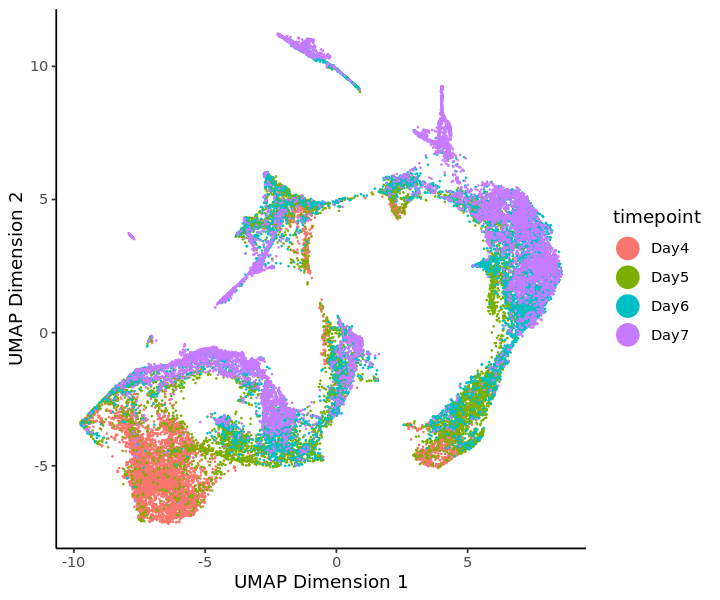

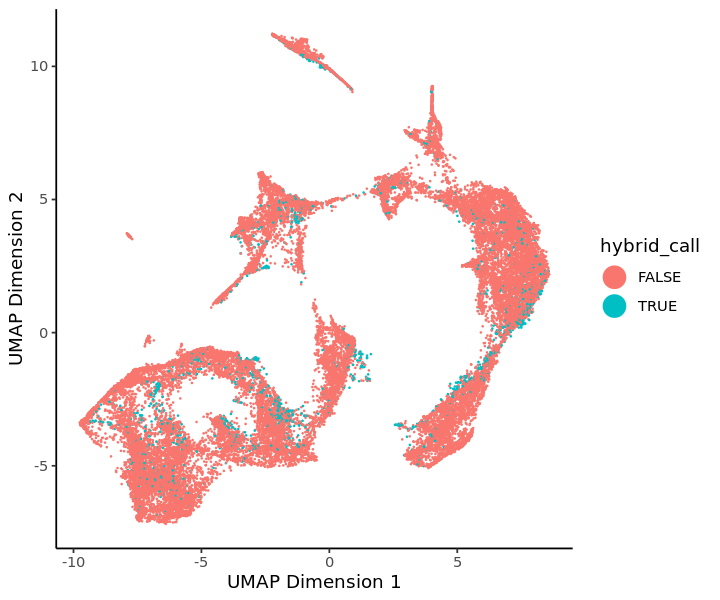

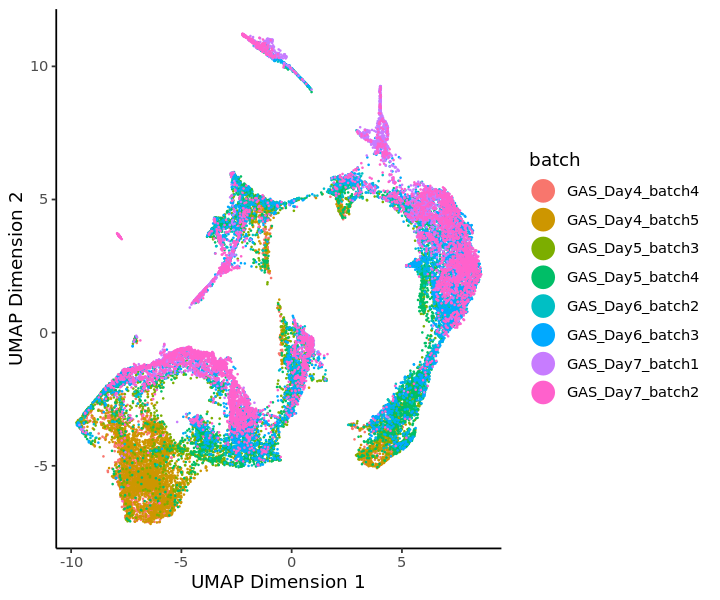

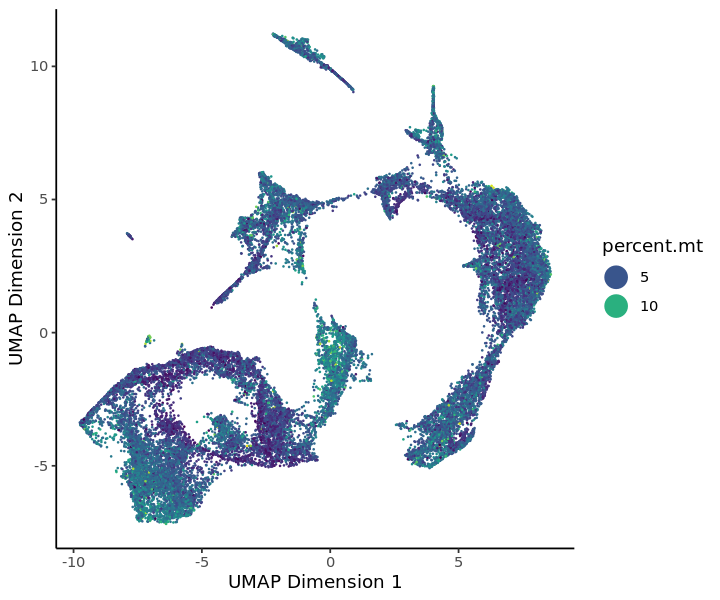

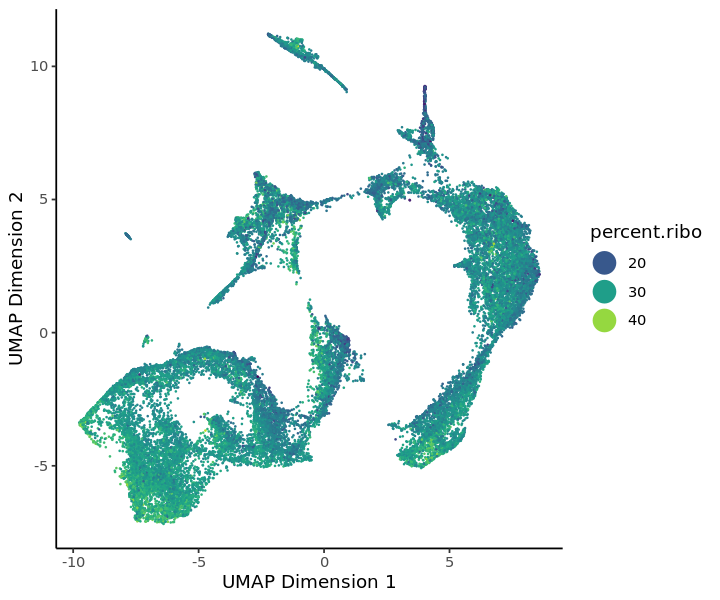

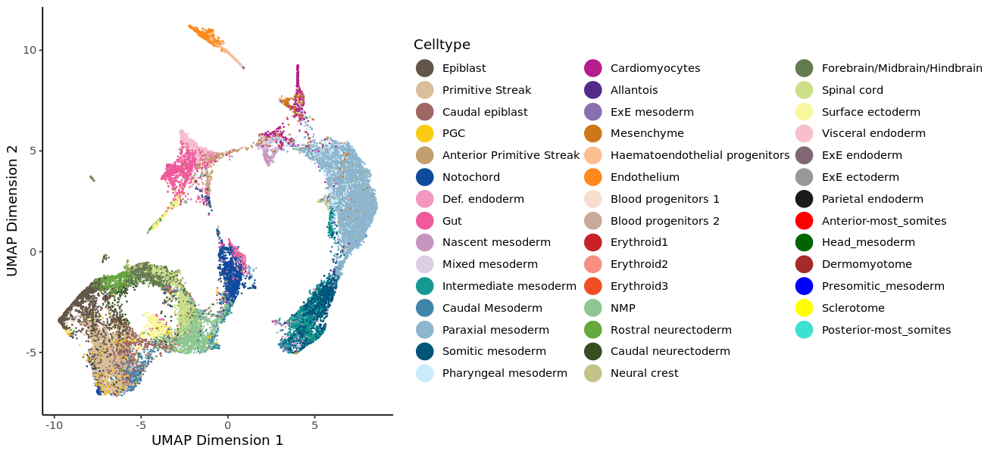

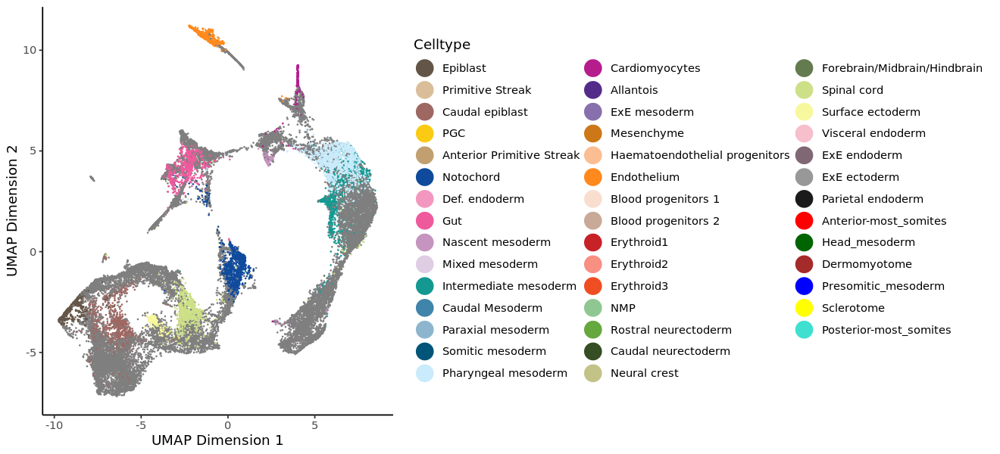

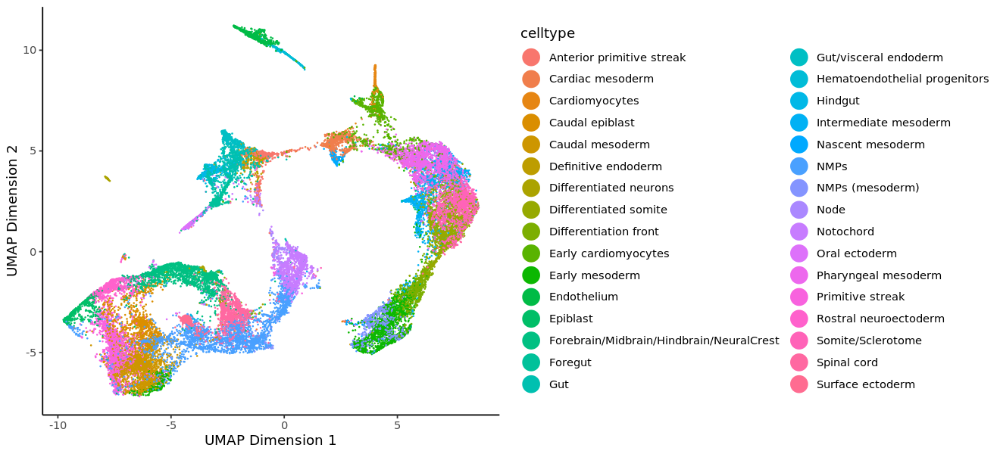

In [18]:
options(repr.plot.width=6, repr.plot.height=5)
p <- ggplot(data=plot_df_joined, mapping = aes(x=X1, y=X2, colour=timepoint)) +
  geom_point(size=0.1, alpha=1) +
  # ggrastr::geom_point_rast(size=io$dot_size, alpha=io$dot_alpha) +
  labs(x="UMAP Dimension 1", y="UMAP Dimension 2") +
  guides(colour = guide_legend(override.aes = list(size=6))) +
  theme_classic()
print(p)
p <- ggplot(data=plot_df_joined, mapping = aes(x=X1, y=X2, colour=hybrid_call)) +
  geom_point(size=0.1, alpha=1) +
  # ggrastr::geom_point_rast(size=io$dot_size, alpha=io$dot_alpha) +
  labs(x="UMAP Dimension 1", y="UMAP Dimension 2") +
  guides(colour = guide_legend(override.aes = list(size=6))) +
  theme_classic()
print(p)
p <- ggplot(data=plot_df_joined, mapping = aes(x=X1, y=X2, colour=batch)) +
  geom_point(size=0.1, alpha=1) +
  # ggrastr::geom_point_rast(size=io$dot_size, alpha=io$dot_alpha) +
  labs(x="UMAP Dimension 1", y="UMAP Dimension 2") +
  guides(colour = guide_legend(override.aes = list(size=6))) +
  theme_classic()
print(p)
p <- ggplot(data=plot_df_joined, mapping = aes(x=X1, y=X2, colour=percent.mt)) +
  geom_point(size=0.1, alpha=1) +
  # ggrastr::geom_point_rast(size=io$dot_size, alpha=io$dot_alpha) +
  labs(x="UMAP Dimension 1", y="UMAP Dimension 2") +
  scale_colour_viridis() +
  guides(colour = guide_legend(override.aes = list(size=6))) +
  theme_classic()
print(p)
p <- ggplot(data=plot_df_joined, mapping = aes(x=X1, y=X2, colour=percent.ribo)) +
  geom_point(size=0.1, alpha=1) +
  # ggrastr::geom_point_rast(size=io$dot_size, alpha=io$dot_alpha) +
  labs(x="UMAP Dimension 1", y="UMAP Dimension 2") +
  scale_colour_viridis() +
  guides(colour = guide_legend(override.aes = list(size=6))) +
  theme_classic()
print(p)
options(repr.plot.width=11, repr.plot.height=5)
p <- ggplot(data=plot_df_joined, mapping = aes(x=X1, y=X2, colour=pijuansala_transfer)) +
  geom_point(size=0.1, alpha=1) +
  # ggrastr::geom_point_rast(size=io$dot_size, alpha=io$dot_alpha) +
  labs(x="UMAP Dimension 1", y="UMAP Dimension 2") +
  scale_colour_manual(values = celltype_colours, name = "Celltype") +
  guides(colour = guide_legend(override.aes = list(size=6))) +
  theme_classic()
print(p)
p <- ggplot(data=plot_df_joined, mapping = aes(x=X1, y=X2, colour=celltype)) +
  geom_point(size=0.1, alpha=1) +
  # ggrastr::geom_point_rast(size=io$dot_size, alpha=io$dot_alpha) +
  labs(x="UMAP Dimension 1", y="UMAP Dimension 2") +
  scale_colour_manual(values = celltype_colours, name = "Celltype") +
  guides(colour = guide_legend(override.aes = list(size=6))) +
  theme_classic()
print(p)
p <- ggplot(data=plot_df_joined, mapping = aes(x=X1, y=X2, colour=celltype)) +
  geom_point(size=0.1, alpha=1) +
  # ggrastr::geom_point_rast(size=io$dot_size, alpha=io$dot_alpha) +
  labs(x="UMAP Dimension 1", y="UMAP Dimension 2") +
  guides(colour = guide_legend(override.aes = list(size=6))) +
  theme_classic()
print(p)

# Map to atlas

# Map to my gastruloids

In [18]:
g_meta <- fread('/nfs/research/marioni/Leah/gastrulation_epigenetics/gastruloid_characterisation/data_dir/processed_files_Leah/scRNAseq/plot_df_joined.txt.gz')
g_meta[MULTI_class %in% as.vector(unlist(neural)), gastr_type := "neural"]
g_meta[MULTI_class %in% as.vector(unlist(meso)), gastr_type := "meso"]
g_meta[MULTI_class %in% as.vector(unlist(intermediate)), gastr_type := "intermediate"]
g_srat <- readRDS("/nfs/research/marioni/Leah/gastrulation_epigenetics/gastruloid_characterisation/data_dir/processed_files_Leah/scRNAseq/seurat.rds")[,g_meta$cell]
g_mapping <- readRDS('/nfs/research/marioni/Leah/gastrulation_epigenetics/gastruloid_characterisation/data_dir/processed_files_Leah/scRNAseq/mapping/gastr_mapping_2.rds')

In [88]:
sce_rossi <- Seurat::as.SingleCellExperiment( srat_rossi )
rownames(colData(sce_rossi)) <- colData(sce_rossi)$cell
meta_rossi <- copy(md)
meta_rossi$batch <- NULL
meta_rossi <- setnames(meta_rossi, c("Dataset", "stage"), c("batch", "timepoint"))
meta_rossi[timepoint == 'Day7', timepoint := 'd7']
meta_rossi[timepoint == 'Day6', timepoint := 'd6']
meta_rossi[timepoint == 'Day5', timepoint := 'd5']
meta_rossi[timepoint == 'Day4', timepoint := 'd4']

sce_rosen <- Seurat::as.SingleCellExperiment( g_srat )
rownames(colData(sce_rosen)) <- colData(sce_rosen)$cell
meta_rosen <- g_meta
meta_rosen$timepoint <- meta_rosen$timepoint.base
meta_rosen$batch <- meta_rosen$experiment

genes <- intersect(rownames(sce_rosen), rownames(sce_rossi))
genes <- genes[genes %in% as.data.table(srat_rossi@assays$RNA@meta.features)[!(cc_gene)]$ens_id]

sce_all <- SingleCellExperiment::SingleCellExperiment(
    list(counts=Matrix::Matrix(cbind(counts(sce_rosen[genes,]),counts(sce_rossi[genes,])),sparse=TRUE)))
meta_all <- rbind(meta_rosen, meta_rossi, fill=TRUE)

In [89]:
message("MNN mapping...")
correct_sce <- mapNoAtlas(sce_all, meta_all, k = io$k, npcs = io$npcs, return.list = FALSE)
meta_all <- rbind(g_meta, meta_rossi, fill=TRUE)
message("Done")

MNN mapping...

Normalizing joint dataset...

Done


Computing highly variable genes...

Done


Performing PCA...

Done


Batch effect correction...

c("d7", "d7", "d6", "d6", "d5", "d5", "d5", "d4.5_d5", "d4_d4.5", "d4_d4.5", "d4", "d4", "d4", "d3.5_d4", "d3", "d3")c("GAS_Day7_batch2", "GAS_Day7_batch1", "GAS_Day6_batch3", "GAS_Day6_batch2", "exp1_d5", "GAS_Day5_batch4", "GAS_Day5_batch3", "exp6_d4.5_d5", "exp3C_d4_d4.5", "exp3B_d4_d4.5", "GAS_Day4_batch5", "GAS_Day4_batch4", "gastr_d4", "exp5_d3.5_d4", "exp4_d3", "gastr_d3")c(4316, 3186, 4498, 3815, 9042, 4316, 3467, 16272, 5069, 4239, 4074, 2824, 2024, 20767, 9241, 2176)

Done


Done


Done



In [90]:
UMAP <- umap(correct_sce$corrected, random_state=2402)
tmp <- data.frame(UMAP$layout)
tmp$cell <- rownames(tmp)
tmp <- as.data.table(tmp)
tmp <- setnames(tmp, c("X1", "X2"), c("X1_RossiInt", "X2_RossiInt"))
plot_df_joined <- merge(tmp, meta_all, by=c("cell")) %>% as.data.table

In [91]:
colors.table <- read.table(file = "/nfs/research/marioni/Leah/gastrulation_epigenetics/gastruloid_characterisation/other_data/rossi/ClusterColors.tsv", sep="\t", header = T, comment.char = "", as.is = T)
colors.use_ab.initio   <- setNames(colors.table$color[!is.na(colors.table$ab_initio_identity)],colors.table$ab_initio_identity[!is.na(colors.table$ab_initio_identity)])
colors.use_transferred <- setNames(colors.table$color[!is.na(colors.table$transferred_identity)],colors.table$transferred_identity[!is.na(colors.table$transferred_identity)])
colors.use_stages <- setNames(c('#6165fb','#f854ee','#f85454','#f8ea54','#4144d4','#6165fb','#8c61fb','#b861fb','#f854ee','#f8548a','#f85554','#f87d54','#f8ea54'),c("Day4","Day5","Day6","Day7","E6.5","E6.75","E7.0","E7.25","E7.5","E7.75","E8.0","E8.25","E8.5"))
int_tp_colours <- c(timepoint_colours, 'd6'='#5d2aa1', 'd7'='#000000')
int_celltype_colours <- c(colors.use_ab.initio, cluster_colours)

In [92]:
plot_df_joined$dataset <- 'Gastruloids'
plot_df_joined[orig.ident == 'GAS', dataset := 'CardiacGastruloids']

plot_df_joined[celltype == 'Forebrain/Midbrain/Hindbrain/NeuralCrest', celltype := 'Radial glia-like/Neural crest']
plot_df_joined[celltype == 'Differentiated neurons', celltype := 'Neuroblasts/Neurons']

plot_df_joined$celltype_merge <- plot_df_joined$cluster
plot_df_joined[orig.ident == 'GAS', celltype_merge := celltype]

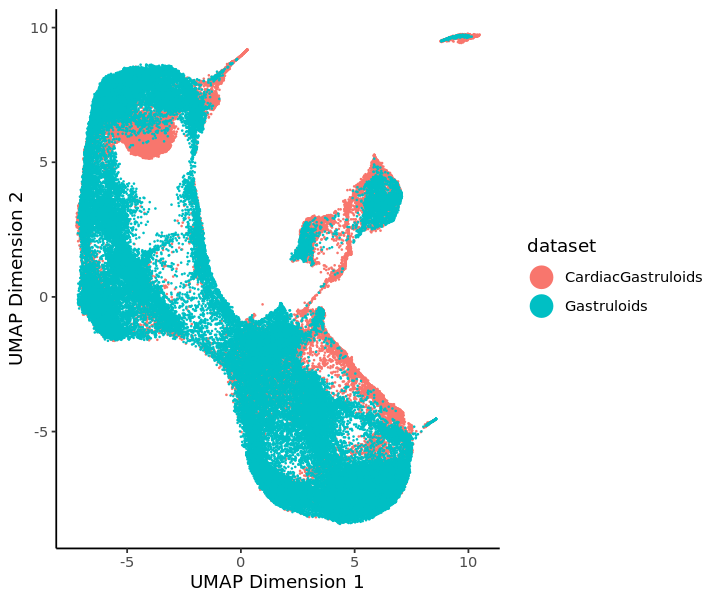

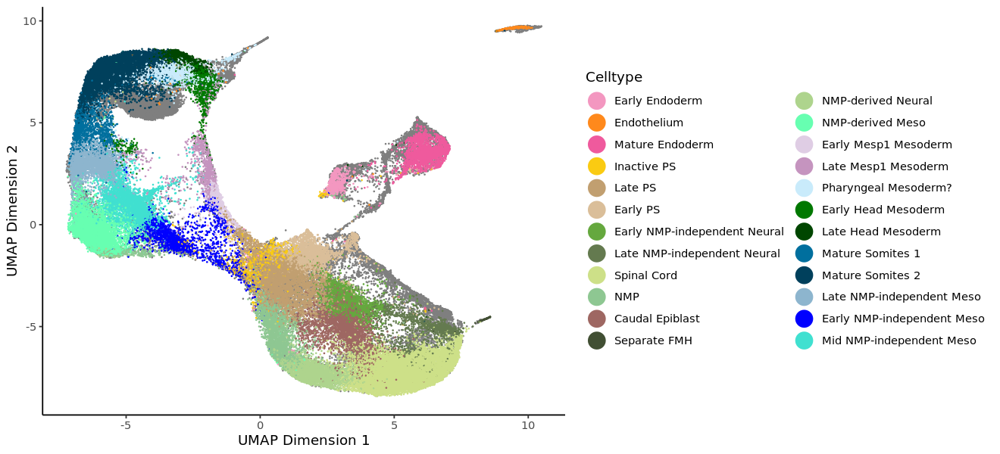

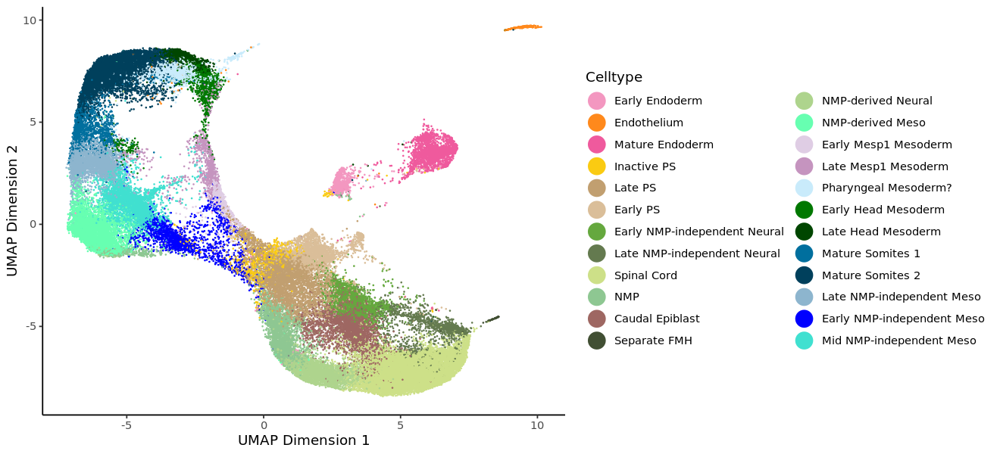

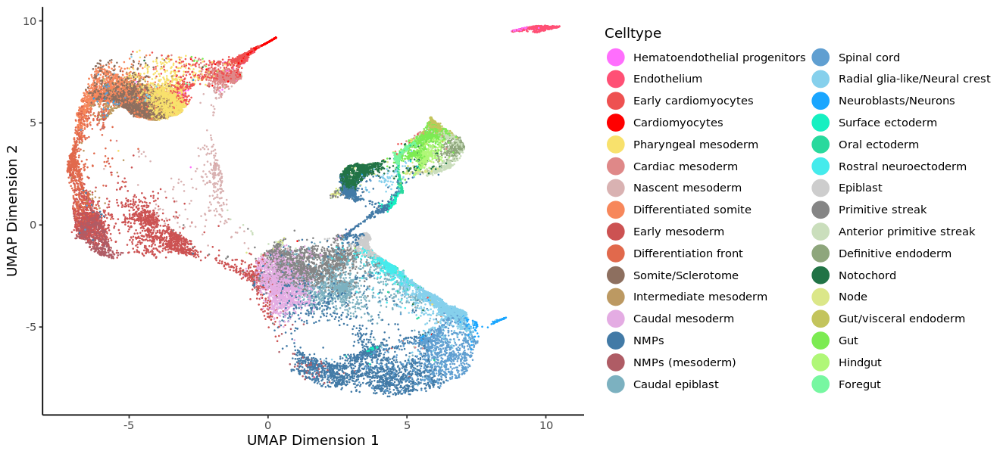

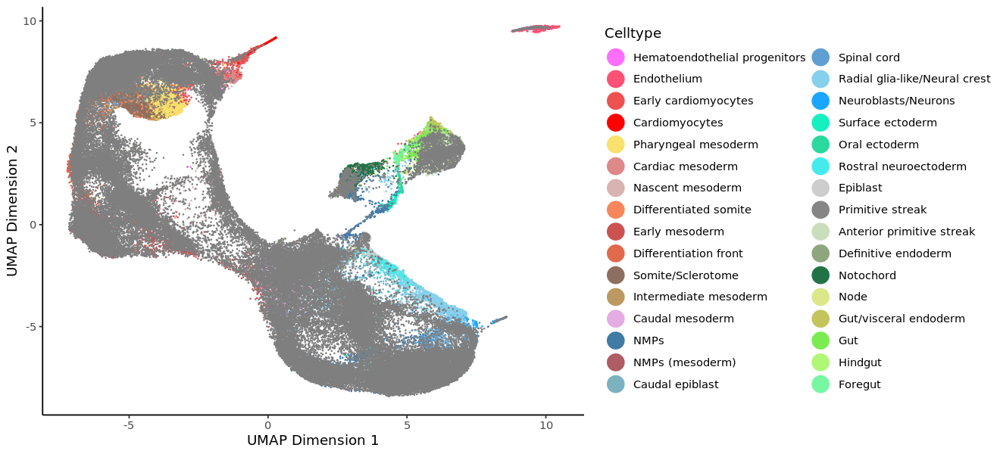

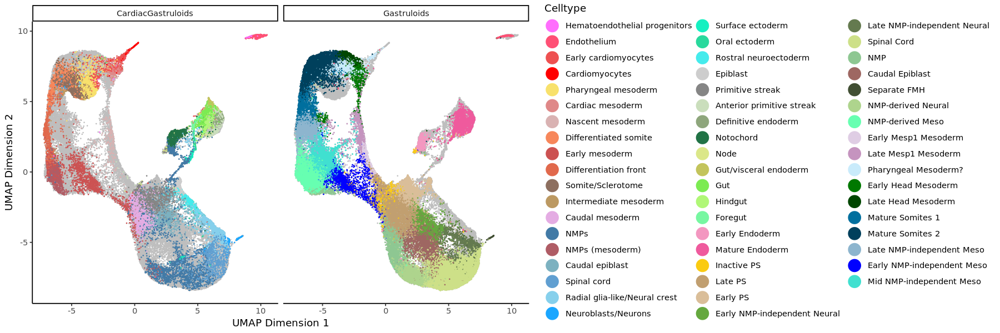

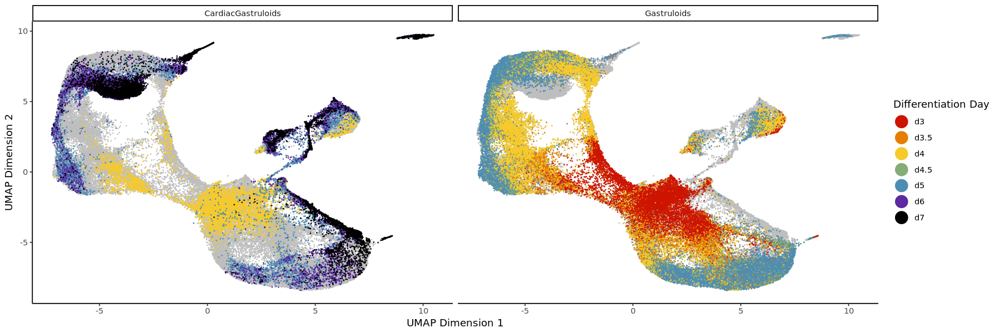

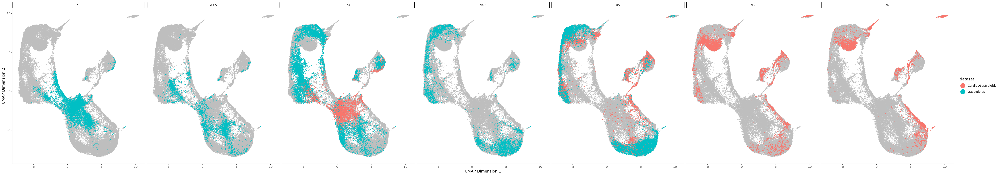

In [93]:
options(repr.plot.width=6, repr.plot.height=5)
p <- ggplot(data=plot_df_joined, mapping = aes(x=X1_RossiInt, y=X2_RossiInt, colour=dataset)) +
  geom_point(size=0.1, alpha=1) +
  # ggrastr::geom_point_rast(size=io$dot_size, alpha=io$dot_alpha) +
  labs(x="UMAP Dimension 1", y="UMAP Dimension 2") +
  guides(colour = guide_legend(override.aes = list(size=6))) +
  theme_classic()
print(p)

options(repr.plot.width=11, repr.plot.height=5)
p <- ggplot(data=plot_df_joined, mapping = aes(x=X1_RossiInt, y=X2_RossiInt, colour=cluster)) +
  geom_point(size=0.1, alpha=1) +
  # ggrastr::geom_point_rast(size=io$dot_size, alpha=io$dot_alpha) +
  labs(x="UMAP Dimension 1", y="UMAP Dimension 2") +
  scale_colour_manual(values = cluster_colours, name = "Celltype") +
  guides(colour = guide_legend(override.aes = list(size=6))) +
  theme_classic()
print(p)

p <- ggplot(data=plot_df_joined[dataset=='Gastruloids'], mapping = aes(x=X1_RossiInt, y=X2_RossiInt, colour=cluster)) +
  geom_point(size=0.1, alpha=1) +
  # ggrastr::geom_point_rast(size=io$dot_size, alpha=io$dot_alpha) +
  labs(x="UMAP Dimension 1", y="UMAP Dimension 2") +
  scale_colour_manual(values = cluster_colours, name = "Celltype") +
  guides(colour = guide_legend(override.aes = list(size=6))) +
  theme_classic()
print(p)

p <- ggplot(data=plot_df_joined[dataset=='CardiacGastruloids'], mapping = aes(x=X1_RossiInt, y=X2_RossiInt, colour=celltype)) +
  geom_point(size=0.1, alpha=1) +
  # ggrastr::geom_point_rast(size=io$dot_size, alpha=io$dot_alpha) +
  labs(x="UMAP Dimension 1", y="UMAP Dimension 2") +
  scale_colour_manual(values = colors.use_ab.initio, name = "Celltype") +
  guides(colour = guide_legend(override.aes = list(size=6))) +
  theme_classic()
print(p)

p <- ggplot(data=plot_df_joined, mapping = aes(x=X1_RossiInt, y=X2_RossiInt, colour=celltype)) +
  geom_point(size=0.1, alpha=1) +
  # ggrastr::geom_point_rast(size=io$dot_size, alpha=io$dot_alpha) +
  labs(x="UMAP Dimension 1", y="UMAP Dimension 2") +
  scale_colour_manual(values = colors.use_ab.initio, name = "Celltype") +
  guides(colour = guide_legend(override.aes = list(size=6))) +
  theme_classic()
print(p)

options(repr.plot.width=15, repr.plot.height=5)
p <- ggplot(data=plot_df_joined, mapping = aes(x=X1_RossiInt, y=X2_RossiInt, colour=celltype_merge)) +
  geom_point(data=select(plot_df_joined,-dataset), colour="grey", size=0.1, alpha=1) +
  geom_point(size=0.1, alpha=1) +
  # ggrastr::geom_point_rast(size=opts$dot_size, alpha=opts$dot_alpha) +
  labs(x="UMAP Dimension 1", y="UMAP Dimension 2") +
  scale_colour_manual(values = int_celltype_colours, name = "Celltype") +
  guides(colour = guide_legend(override.aes = list(size=6))) +
  theme_classic() +
  facet_wrap(~ dataset, nrow=1)
print(p)

options(repr.plot.width=15, repr.plot.height=5)
p <- ggplot(data=plot_df_joined, mapping = aes(x=X1_RossiInt, y=X2_RossiInt, colour=timepoint)) +
  geom_point(data=select(plot_df_joined,-dataset), colour="grey", size=0.1, alpha=1) +
  geom_point(size=0.1, alpha=1) +
  # ggrastr::geom_point_rast(size=opts$dot_size, alpha=opts$dot_alpha) +
  labs(x="UMAP Dimension 1", y="UMAP Dimension 2") +
  scale_colour_manual(values = int_tp_colours, name = "Differentiation Day") +
  guides(colour = guide_legend(override.aes = list(size=6))) +
  theme_classic() +
  facet_wrap(~ dataset, nrow=1)
print(p)

options(repr.plot.width=40, repr.plot.height=7)
plot_df_joined_shuffle <- plot_df_joined[sample(nrow(plot_df_joined)),]
timepoint_order_ext <- c('d3', 'd3.5', 'd4', 'd4.5', 'd5', 'd6', 'd7')
plot_df_joined_shuffle$timepoint <- factor(plot_df_joined_shuffle$timepoint, levels=timepoint_order_ext)
p <- ggplot(data=plot_df_joined_shuffle[timepoint %in% timepoint_order_ext], mapping = aes(x=X1_RossiInt, y=X2_RossiInt, colour=dataset)) +
  geom_point(data=select(plot_df_joined_shuffle,-timepoint), colour="grey", size=0.1, alpha=1) +
  geom_point(size=0.1, alpha=1) +
  # ggrastr::geom_point_rast(size=opts$dot_size, alpha=opts$dot_alpha) +
  labs(x="UMAP Dimension 1", y="UMAP Dimension 2") +
  guides(colour = guide_legend(override.aes = list(size=6))) +
  theme_classic() +
  facet_wrap(~ timepoint, nrow=1)
print(p)

In [26]:
correct_rosen <- correct[1:nrow(meta_rosen),]
correct_rossi <- correct[-(1:nrow(meta_rosen)),]
mapping <- get_meta(correct_atlas = correct_rosen,
                  atlas_meta = meta_rosen,
                  correct_map = correct_rossi,
                  map_meta = meta_rossi,
                  k_map = k)
message("Done\n")

if(return.list){
return(mapping)
}

message("Computing mapping scores...") 
out <- list()
for (i in seq(from = 1, to = k)) {
out$closest.cells[[i]]     <- sapply(mapping, function(x) x$cells.mapped[i])
out$celltypes.mapped[[i]]  <- sapply(mapping, function(x) x$celltypes.mapped[i])
out$cellstages.mapped[[i]] <- sapply(mapping, function(x) x$stages.mapped[i])
}  
multinomial.prob <- getMappingScore(out)
message("Done\n")

message("Writing output...") 
out$correct_atlas <- correct_atlas
out$correct_map <- correct_map
ct <- sapply(mapping, function(x) x$celltype.mapped); is.na(ct) <- lengths(ct) == 0
st <- sapply(mapping, function(x) x$stage.mapped); is.na(st) <- lengths(st) == 0
cm <- sapply(mapping, function(x) x$cells.mapped[1]); is.na(cm) <- lengths(cm) == 0
out$mapping <- data.frame(
  cell            = names(mapping), 
  celltype.mapped = unlist(ct),
  stage.mapped    = unlist(st),
  closest.cell    = unlist(cm),
  stringsAsFactors=FALSE)

out$mapping <- cbind(out$mapping,multinomial.prob)
message("Done\n")

ERROR: Error in eval(expr, envir, enclos): object 'correct' not found


# Get data in form for Carine

In [94]:
# Load data
rownames(plot_df_joined) <- plot_df_joined$cell
merge_counts <- Matrix::Matrix(cbind(counts(sce_rosen[genes,]),counts(sce_rossi[genes,])),sparse=TRUE)
plot_df_joined_toadd <- as.data.frame(plot_df_joined[colnames(merge_counts),])
rownames(plot_df_joined_toadd) <- plot_df_joined_toadd$cell
plot_df_joined_toadd$cluster <- plot_df_joined_toadd$celltype_merge
merge_srat <- CreateSeuratObject(counts=merge_counts,
                                 meta.data=plot_df_joined_toadd
                                )

umap_embeddings <- as.matrix(plot_df_joined[,c("X1_RossiInt", "X2_RossiInt")])
colnames(umap_embeddings) <- c("X1", "X2")
rownames(umap_embeddings) <- plot_df_joined$cell

merge_srat@reductions[["pca"]] <- CreateDimReducObject(
  embeddings = correct_sce$corrected[Cells(merge_srat),],
  loadings = metadata(correct_sce$pca)$rotation,
  key = "PC",
  assay = "RNA"
)
merge_srat@reductions[["umap"]] <- CreateDimReducObject(
  embeddings = umap_embeddings[Cells(merge_srat),],
  key = "UMAP",
  assay = "RNA"
)

DefaultAssay(merge_srat) <- "RNA"

VariableFeatures(merge_srat) <- rownames(merge_srat@reductions$pca@feature.loadings)

genemeta <- genemeta[ens_id %in% rownames(merge_srat)]
rownames(genemeta) <- genemeta$ens_id
merge_srat[["RNA"]] <- AddMetaData(
    object = merge_srat[["RNA"]],
    metadata = genemeta
)

merge_data <- as.SingleCellExperiment(merge_srat)
merge_data <- multiBatchNorm(merge_data, batch=colData(merge_data)$batch)
merge_srat@assays$RNA@data <- logcounts(merge_data)

Warning message:
“Keys should be one or more alphanumeric characters followed by an underscore, setting key from PC to PC_”
Warning message:
“All keys should be one or more alphanumeric characters followed by an underscore '_', setting key to PC_”
Warning message:
“No columnames present in cell embeddings, setting to 'PC_1:50'”
Warning message:
“Keys should be one or more alphanumeric characters followed by an underscore, setting key from UMAP to UMAP_”
Warning message:
“All keys should be one or more alphanumeric characters followed by an underscore '_', setting key to UMAP_”


In [95]:
saveRDS(merge_srat, "/nfs/research/marioni/Leah/gastrulation_epigenetics/gastruloid_characterisation/data_dir/processed_files_Leah/scRNAseq/seurat_rossi_merge.rds")

In [97]:
timepoint_colours <- c("d3" = "#cd1400",
                       "d3.5" = "#E67D00",
                       "d4" = "#f6ca2b",
                       "d4.5" = "#85ad76",
                       "d5" = "#4d8db4",
                       'd6'='#5d2aa1',
                       'd7'='#000000'
                      )

cluster_colours = c(
    "Hematoendothelial progenitors" = '#ff6efd',
    "Endothelium" = '#ff5075',
    "Early cardiomyocytes" = '#ee5151',
    "Cardiomyocytes" = '#ff0000',
    "Pharyngeal mesoderm" = '#f8e16c',
    "Cardiac mesoderm" = '#df8888',
    "Nascent mesoderm" = '#d9b2b2',
    "Differentiated somite" = '#f7875b',
    "Early mesoderm" = '#cc5252',
    "Differentiation front" = '#e1694c',
    "Somite/Sclerotome" = '#8d6f5f',
    "Intermediate mesoderm" = '#bc9962',
    "Caudal mesoderm" = '#e4ace3',
    "NMPs" = '#427aa6',
    "NMPs (mesoderm)" = '#af5c65',
    "Caudal epiblast" = '#7cb1c0',
    "Spinal cord" = '#609fd1',
    "Radial glia-like/Neural crest" = '#86d0ec',
    "Neuroblasts/Neurons" = '#1aa6ff',
    "Surface ectoderm" = '#15f0c1',
    "Oral ectoderm" = '#29d99d',
    "Rostral neuroectoderm" = '#45ebec',
    "Epiblast" = '#cdcdcd',
    "Primitive streak" = '#858585',
    "Anterior primitive streak" = '#cadebc',
    "Definitive endoderm" = '#8ea67c',
    "Notochord" = '#217346',
    "Node" = '#dbe789',
    "Gut/visceral endoderm" = '#c3c45c',
    "Gut" = '#7ceb52',
    "Hindgut" = '#b0f777',
    "Foregut" = '#77f7a1',
    "Early Endoderm" = "#F397C0",
    "Endothelium" = "#ff891c",
    "Mature Endoderm" = "#EF5A9D",
    "Inactive PS" = "#FACB12",
    "Late PS" = "#c19f70",
    "Early PS" = "#DABE99",
    "Early NMP-independent Neural" = "#65A83E",
    "Late NMP-independent Neural" = "#647a4f",
    "Spinal Cord" = "#CDE088",
    "NMP" = "#8EC792",
    "Caudal Epiblast" = "#9e6762",
    "Separate FMH" = "#414f33",
    "NMP-derived Neural" = "#aed48d",
    "NMP-derived Meso" = "#67ffb1",
    "Early Mesp1 Mesoderm" = "#DFCDE4",
    "Late Mesp1 Mesoderm" = "#C594BF",
    "Pharyngeal Mesoderm?" = "#C9EBFB",
    "Early Head Mesoderm" = "#007800",
    "Late Head Mesoderm" = "#004600",
    "Mature Somites 1" = "#006f9e",
    "Mature Somites 2" = "#00405c",
    "Late NMP-independent Meso" = "#8DB5CE",
    "Early NMP-independent Meso" = "blue",
    "Mid NMP-independent Meso" = "turquoise"
)